In [1]:
pip install numpy --upgrade


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install h5py


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
%pip install opencv-python==4.8.0.74


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install scikeras


Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [6]:
import json
import os
import cv2
import numpy as np
import shutil
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
import random
from tensorflow import keras
from keras.utils import to_categorical
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import (Input, DepthwiseConv2D, Conv2D, Add, Flatten,
                                     GlobalAveragePooling2D, Activation, Dense,TimeDistributed, Dropout, LSTM)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score



In [7]:
# Main path: the path should be changed here in order to run on other lab computers

path= 'F:\WLASL'

In [8]:
# Loading data

with open(f'{path}/WLASL_v0.3.json', 'r') as file:
    data = json.load(file)

data

[{'gloss': 'book',
  'instances': [{'bbox': [385, 37, 885, 720],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 0,
    'signer_id': 118,
    'source': 'aslbrick',
    'split': 'train',
    'url': 'http://aslbricks.org/New/ASL-Videos/book.mp4',
    'variation_id': 0,
    'video_id': '69241'},
   {'bbox': [190, 25, 489, 370],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 1,
    'signer_id': 90,
    'source': 'aslsignbank',
    'split': 'train',
    'url': 'https://aslsignbank.haskins.yale.edu/dictionary/protected_media/glossvideo/ASL/BO/BOOK-418.mp4',
    'variation_id': 0,
    'video_id': '65225'},
   {'bbox': [262, 1, 652, 480],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 2,
    'signer_id': 110,
    'source': 'valencia-asl',
    'split': 'train',
    'url': 'https://www.youtube.com/watch?v=0UsjUE-TXns',
    'variation_id': 0,
    'video_id': '68011'},
   {'bbox': [123, 19, 516, 358],
    'fps

In [9]:
# Extracting classes from the class list

class_list = []
with open(f'{path}/wlasl_class_list.txt', 'r') as file:
    for line in file:
        _,label = line.strip().split('\t')
        class_list.append(label)
        
class_list

['book',
 'drink',
 'computer',
 'before',
 'chair',
 'go',
 'clothes',
 'who',
 'candy',
 'cousin',
 'deaf',
 'fine',
 'help',
 'no',
 'thin',
 'walk',
 'year',
 'yes',
 'all',
 'black',
 'cool',
 'finish',
 'hot',
 'like',
 'many',
 'mother',
 'now',
 'orange',
 'table',
 'thanksgiving',
 'what',
 'woman',
 'bed',
 'blue',
 'bowling',
 'can',
 'dog',
 'family',
 'fish',
 'graduate',
 'hat',
 'hearing',
 'kiss',
 'language',
 'later',
 'man',
 'shirt',
 'study',
 'tall',
 'white',
 'wrong',
 'accident',
 'apple',
 'bird',
 'change',
 'color',
 'corn',
 'cow',
 'dance',
 'dark',
 'doctor',
 'eat',
 'enjoy',
 'forget',
 'give',
 'last',
 'meet',
 'pink',
 'pizza',
 'play',
 'school',
 'secretary',
 'short',
 'time',
 'want',
 'work',
 'africa',
 'basketball',
 'birthday',
 'brown',
 'but',
 'cheat',
 'city',
 'cook',
 'decide',
 'full',
 'how',
 'jacket',
 'letter',
 'medicine',
 'need',
 'paint',
 'paper',
 'pull',
 'purple',
 'right',
 'same',
 'son',
 'tell',
 'thursday',
 'visit',
 

In [10]:
# Path to where the videos are stored

video_folder = f'{path}/dataset/SL'


In [11]:
# Opening the missing videos file

missing_videos= []
with open(f'{path}/missing.txt', 'r') as file:
    for line in file:
        video = line.strip()
        missing_videos.append(video)
missing_videos



['65225',
 '68011',
 '68208',
 '68012',
 '70212',
 '70266',
 '07085',
 '07086',
 '07087',
 '07088',
 '07089',
 '07090',
 '07091',
 '07092',
 '07093',
 '07094',
 '07095',
 '07096',
 '07097',
 '07098',
 '07071',
 '07072',
 '07073',
 '67424',
 '07075',
 '07076',
 '07077',
 '07078',
 '07079',
 '07080',
 '07081',
 '07082',
 '07083',
 '07084',
 '70173',
 '68538',
 '68042',
 '68660',
 '68041',
 '17725',
 '17726',
 '17727',
 '17728',
 '17729',
 '17730',
 '17731',
 '17732',
 '17714',
 '17715',
 '17716',
 '17717',
 '17718',
 '67594',
 '17719',
 '12306',
 '68028',
 '69054',
 '12329',
 '12330',
 '12331',
 '12332',
 '12333',
 '12335',
 '12336',
 '12337',
 '67519',
 '12321',
 '12322',
 '12323',
 '12324',
 '05724',
 '70348',
 '68007',
 '05744',
 '05746',
 '05747',
 '05748',
 '05735',
 '05736',
 '05737',
 '09847',
 '70230',
 '68580',
 '70263',
 '68019',
 '09865',
 '09866',
 '09867',
 '09853',
 '09855',
 '09856',
 '67483',
 '09857',
 '09858',
 '09859',
 '09860',
 '09861',
 '09862',
 '09863',
 '24857',


In [12]:
# Removing entries that are in the missing_videos list:

filtered_data = []

for entry in data:
    keep_entry = True
    for instance in entry['instances']:
        if instance['video_id'] in missing_videos:
            keep_entry = False
            break
    if keep_entry:
        filtered_data.append(entry)
        
filtered_data


[{'gloss': 'come here',
  'instances': [{'bbox': [195, 9, 467, 370],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 0,
    'signer_id': 104,
    'source': 'aslsignbank',
    'split': 'val',
    'url': 'https://aslsignbank.haskins.yale.edu/dictionary/protected_media/glossvideo/ASL/E(/E(come-here)-1907.mp4',
    'variation_id': 0,
    'video_id': '65558'},
   {'bbox': [805, 77, 1622, 1080],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 4,
    'signer_id': 4,
    'source': 'signschool',
    'split': 'test',
    'url': 'https://signstock.blob.core.windows.net/signschool/videos/db_uploads/SignSchool%20Come%20Here%202-rl1otBdmKok.mp4',
    'variation_id': 0,
    'video_id': '11862'},
   {'bbox': [79, 10, 214, 192],
    'fps': 25,
    'frame_end': -1,
    'frame_start': 1,
    'instance_id': 5,
    'signer_id': 11,
    'source': 'signingsavvy',
    'split': 'train',
    'url': 'https://www.signingsavvy.com/signs/mp4/9/9902.mp4',
   

In [13]:
# Creating the split folders based on split field in .json file

destination_folder = f"{path}"  

# Creating directories for splits if they don't exist

splits = set([instance['split'] for entry in data for instance in entry['instances']])
for split in splits:
    if not os.path.exists(os.path.join(destination_folder, split)):
        print(f"Creating directory for split: {split}")
        os.makedirs(os.path.join(destination_folder, split))

# Creating a dictionary based on video_id

video_id_to_entry = {}
for entry in data:
    for instance in entry['instances']:
        video_id_to_entry[instance['video_id']] = instance

print(f"Video ID dictionary created with {len(video_id_to_entry)} entries.")

# Iterating through each gloss folder

for gloss in os.listdir(video_folder):
    gloss_path = os.path.join(video_folder, gloss)
    if os.path.isdir(gloss_path):
        for video in os.listdir(gloss_path):
            
            # geting filename which is the video ID without extension .mp4
            
            video_id = os.path.splitext(video)[0]  
            
            # Checking the split using video_id dictionary
            
            instance = video_id_to_entry.get(video_id)
            if instance:
                split = instance['split']
                target_folder = os.path.join(destination_folder, split, gloss)
                if not os.path.exists(target_folder):                   
                    print(f"Creating directory for gloss: {gloss} in split: {split}")

                    os.makedirs(target_folder)

                # Moving the videos to their respective split folders
                print(f"Copying video {video_id} of gloss {gloss} to {split}")

                shutil.copy(os.path.join(gloss_path, video), os.path.join(target_folder, video))

Video ID dictionary created with 21083 entries.
Copying video 01610 of gloss a to train
Copying video 01611 of gloss a to train
Copying video 01612 of gloss a to train
Copying video 01615 of gloss a to train
Copying video 66039 of gloss a to test
Copying video 02124 of gloss a lot to train
Copying video 02125 of gloss a lot to train
Copying video 02126 of gloss a lot to train
Copying video 02128 of gloss a lot to test
Copying video 02129 of gloss a lot to train
Copying video 02130 of gloss a lot to val
Copying video 02131 of gloss a lot to train
Copying video 00335 of gloss abdomen to test
Copying video 00336 of gloss abdomen to train
Copying video 00338 of gloss abdomen to train
Copying video 00339 of gloss abdomen to val
Copying video 00341 of gloss abdomen to train
Copying video 00376 of gloss able to test
Copying video 00377 of gloss able to train
Copying video 00378 of gloss able to train
Copying video 00381 of gloss able to train
Copying video 00382 of gloss able to val
Copying v

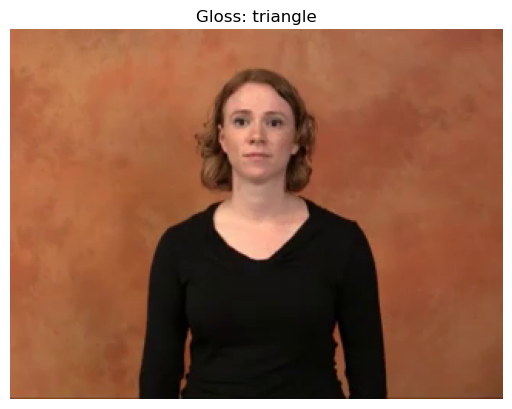

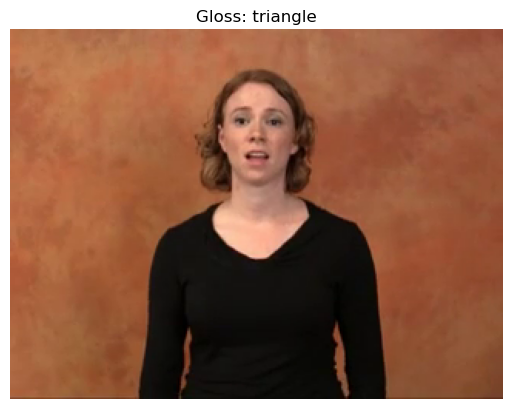

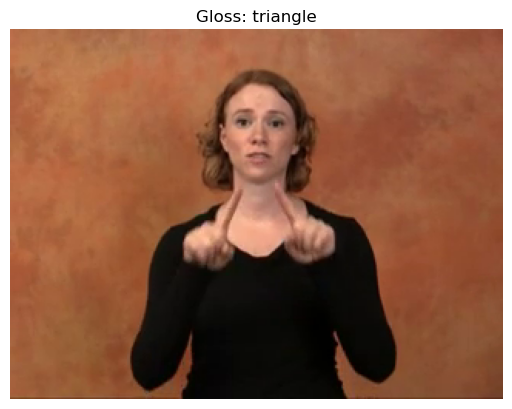

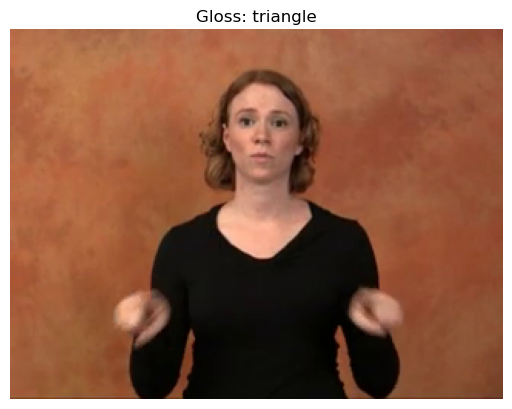

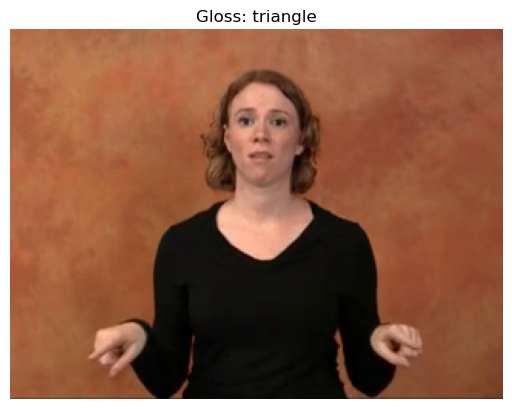

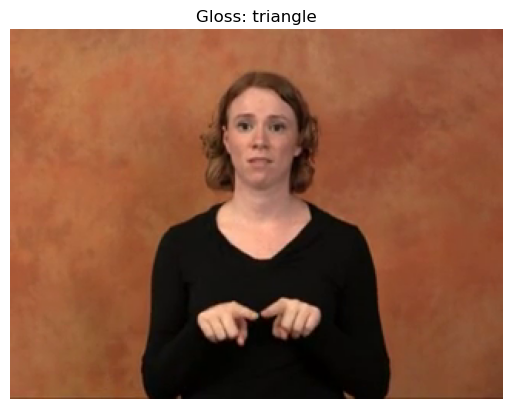

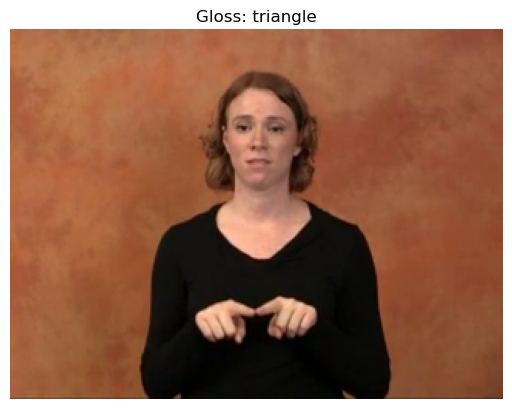

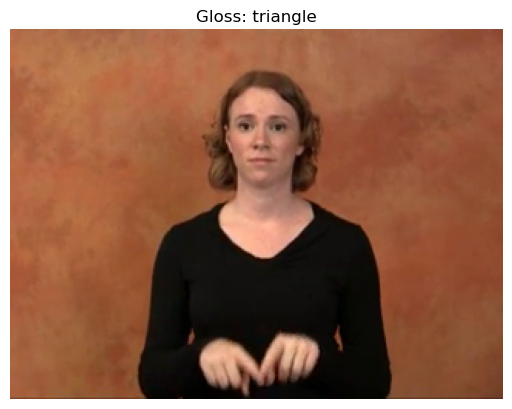

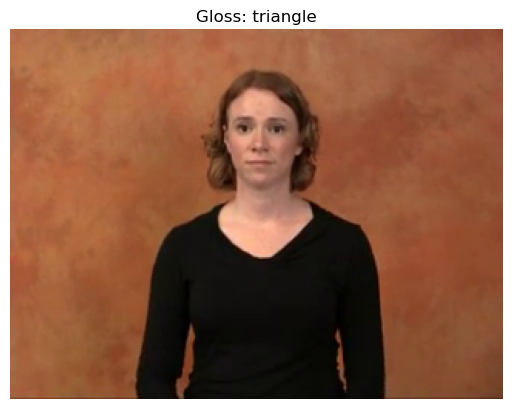

In [15]:
def display_all_video_frames(video_path, gloss):

    # Opening the video file

    cap = cv2.VideoCapture(video_path)

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Displaying every 10th frame
        
        if frame_count % 10 == 0:
            
            # Converting the frame from BGR to RGB format
            
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Displaying frame with gloss
            
            plt.imshow(frame_rgb)
            plt.title(f"Gloss: {gloss}")
            plt.axis('off')
            plt.show()

        frame_count += 1
    cap.release()

video_id = '59596'

# Searching for the corresponding gloss in the JSON data

gloss = None
for entry in data:
    if entry['instances'][0]['video_id'] == video_id:
        gloss = entry['gloss']
        break

if gloss is None:
    print(f"No gloss found for video ID: {video_id}")
else:
    video_path = f'{path}/dataset/SL/triangle/{video_id}.mp4'
    display_all_video_frames(video_path, gloss)
    



In [16]:
# Checking for the dimension of the videos in the dataset

def get_video_dimensions(video_path):
    cap = cv2.VideoCapture(video_path)
    width  = int(cap.get(3))  
    height = int(cap.get(4))  
    cap.release()
    return (width, height)

all_videos = []

# Iterating through each class's (gloss's) folder to gather all video paths

for gloss in os.listdir(video_folder):
    gloss_path = os.path.join(video_folder, gloss)
    if os.path.isdir(gloss_path):
        for video in os.listdir(gloss_path):
            video_path = os.path.join(gloss_path, video)
            all_videos.append(video_path)

# Selecting 10 random videos

selected_videos = random.sample(all_videos, 10)

# Checking  dimensions for selected videos

for video_path in selected_videos:
    dimensions = get_video_dimensions(video_path)
    print(f"Video_id: {os.path.basename(video_path)}, Dimensions: {dimensions[0]}x{dimensions[1]}")


Video_id: 16197.mp4, Dimensions: 640x480
Video_id: 30056.mp4, Dimensions: 320x240
Video_id: 20445.mp4, Dimensions: 720x400
Video_id: 58626.mp4, Dimensions: 720x400
Video_id: 65407.mp4, Dimensions: 656x370
Video_id: 55315.mp4, Dimensions: 1920x1080
Video_id: 16117.mp4, Dimensions: 720x400
Video_id: 16220.mp4, Dimensions: 720x400
Video_id: 09956.mp4, Dimensions: 1920x1080
Video_id: 47063.mp4, Dimensions: 288x192


In [20]:
# ref:https://stackoverflow.com/questions/44720580/resize-image-to-maintain-aspect-ratio-in-python-opencv

def add_padding(frame, desired_size):

    # Original frame dimensions representing width and height
    
    old_size = frame.shape[:2]  

    # Computing the ratio for resizing by choosing the dimension that needs to be downscaled the most
    
    ratio = min(desired_size[0] / old_size[0], desired_size[1] / old_size[1])

    # New dimensions
    
    new_size = tuple([int(dim * ratio) for dim in old_size])

    # Resizing the frame
    
    frame = cv2.resize(frame, (new_size[1], new_size[0]))

    # Computing deltas to add padding
    
    delta_w = desired_size[1] - new_size[1]
    delta_h = desired_size[0] - new_size[0]
    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)

    # Padding the frame with black pixels
    
    color = [0, 0, 0]  
    frame_with_padding = cv2.copyMakeBorder(frame, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)

    return frame_with_padding



In [21]:
def extract_frames(video_path, output_folder, video_id, gloss, desired_size=(32, 32)):
    cap = cv2.VideoCapture(video_path)
    frame_count = 0
    saved_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 10 == 0:
            
            # Add padding to the frame
            
            padded_frame = add_padding(frame, desired_size=desired_size)
            
            # Modifying the filename to incorporate glosses
            
            output_filename = os.path.join(output_folder, gloss, f"{gloss}_{video_id}_frame_{frame_count}.jpg")  
            if not os.path.exists(os.path.dirname(output_filename)):
                os.makedirs(os.path.dirname(output_filename))
            cv2.imwrite(output_filename, padded_frame)
            saved_count += 1

        frame_count += 1

    cap.release()
    return saved_count

base_output_folder = f"{path}/frames"

desired_size = (32, 32) 

for entry in data:
    for instance in entry['instances']:
        video_id = instance['video_id']
        gloss = entry['gloss']
        
        # Extracting the split value
        
        split = instance['split']  
        video_path = os.path.join(video_folder, gloss, f"{video_id}.mp4")
        
        # Adjusting the output folder based on the split
        
        split_output_folder = os.path.join(base_output_folder, split)
        
         # Creating the split folder if it doesn't exist
            
        if not os.path.exists(split_output_folder): 
            os.makedirs(split_output_folder)

        # Checking if video exists before processing

        print(f"Processing gloss {gloss} with video ID {video_id} ...")
        if os.path.exists(video_path):
            print(f"Found video at path: {video_path}")
            saved_count = extract_frames(video_path, split_output_folder, video_id, gloss, desired_size=desired_size)
            print(f"Saved {saved_count} frames for Video ID {video_id} under gloss {gloss} in {split} folder.")
        else:
            print(f"Video not found at path: {video_path}")



Processing gloss book with video ID 69241 ...
Found video at path: F:\WLASL/dataset/SL\book\69241.mp4
Saved 8 frames for Video ID 69241 under gloss book in train folder.
Processing gloss book with video ID 65225 ...
Video not found at path: F:\WLASL/dataset/SL\book\65225.mp4
Processing gloss book with video ID 68011 ...
Video not found at path: F:\WLASL/dataset/SL\book\68011.mp4
Processing gloss book with video ID 68208 ...
Video not found at path: F:\WLASL/dataset/SL\book\68208.mp4
Processing gloss book with video ID 68012 ...
Video not found at path: F:\WLASL/dataset/SL\book\68012.mp4
Processing gloss book with video ID 70212 ...
Video not found at path: F:\WLASL/dataset/SL\book\70212.mp4
Processing gloss book with video ID 70266 ...
Video not found at path: F:\WLASL/dataset/SL\book\70266.mp4
Processing gloss book with video ID 07085 ...
Video not found at path: F:\WLASL/dataset/SL\book\07085.mp4
Processing gloss book with video ID 07086 ...
Video not found at path: F:\WLASL/dataset/

In [22]:
# Loading the missing video IDs from the missing.txt file

with open(f'{path}/missing.txt', 'r') as file:

    # Converting to a set for faster lookups
    
    missing_videos = set(file.read().splitlines())
missing_videos

{'31854',
 '53774',
 '28002',
 '70200',
 '01509',
 '62695',
 '15209',
 '15478',
 '36716',
 '49546',
 '68033',
 '39074',
 '67541',
 '43880',
 '15161',
 '47092',
 '14982',
 '40827',
 '02830',
 '68342',
 '67796',
 '18878',
 '10900',
 '69042',
 '24745',
 '31690',
 '42473',
 '25424',
 '20769',
 '25690',
 '54599',
 '26087',
 '03126',
 '70019',
 '61587',
 '21856',
 '31846',
 '57049',
 '18226',
 '55980',
 '37587',
 '68586',
 '03320',
 '67534',
 '22513',
 '34212',
 '31072',
 '68079',
 '14055',
 '63597',
 '58945',
 '65805',
 '20991',
 '27415',
 '68564',
 '68088',
 '68828',
 '32319',
 '15174',
 '67114',
 '43346',
 '67721',
 '13226',
 '41306',
 '04833',
 '38042',
 '62194',
 '48895',
 '13467',
 '09240',
 '34685',
 '24613',
 '45688',
 '09149',
 '16988',
 '02827',
 '37889',
 '07679',
 '02543',
 '56285',
 '22747',
 '70026',
 '42556',
 '07593',
 '36864',
 '19769',
 '44609',
 '39450',
 '67108',
 '63291',
 '55749',
 '53244',
 '10196',
 '63826',
 '03157',
 '69070',
 '29095',
 '60966',
 '17664',
 '31902',


In [23]:
# Function to adjust the video sequences length

def adjust_sequence_length(frames, desired_length=8):
    if len(frames) == desired_length:
        return frames
    indices = np.linspace(0, len(frames) - 1, desired_length).astype(int)
    return [frames[i] for i in indices]

# Class structure used for the video frame generation

class VideoFrameGenerator(Sequence):
    def __init__(self, folder_path, split="train", batch_size=32, desired_length=8, input_shape=(32, 32, 3), num_classes=2000):
        self.folder_path = folder_path
        self.split = split
        self.batch_size = batch_size
        self.desired_length = desired_length
        self.input_shape = input_shape
        self.num_classes = num_classes

        # Initializing video paths and labels
        
        self.video_paths = []
        self.labels = []
        split_folder = os.path.join(folder_path, split)
        for gloss in os.listdir(split_folder):
            gloss_folder = os.path.join(split_folder, gloss)
            file_names = os.listdir(gloss_folder)
            
            # Extracting unique video_ids from file names
            
            video_ids = list(set([f.split('_')[0] for f in file_names]))
            
            for video_id in video_ids:
                video_files = [f for f in file_names if f.startswith(video_id)]
                
                # Ensuring there's a path for every frame of the video
                
                video_path = [os.path.join(gloss_folder, vf) for vf in video_files]
                self.video_paths.extend(video_path)
                self.labels.extend([gloss] * len(video_files))
        
        # Converting labels to categorical and label encoding
        
        self.le = LabelEncoder()
        self.labels = self.le.fit_transform(self.labels)
        self.labels = to_categorical(self.labels, num_classes=num_classes)
        
    def __len__(self):
        return int(np.ceil(len(self.video_paths) / self.batch_size))
    
    def __getitem__(self, idx):
        
        # Calculating the actual batch size
        
        actual_batch_size = min(self.batch_size, len(self.video_paths) - idx * self.batch_size)
        
        # Initializing batch arrays
        batch_x = np.zeros((actual_batch_size, self.desired_length, *self.input_shape))
        batch_y = np.zeros((actual_batch_size, self.num_classes))

        for i in range(actual_batch_size):
            frame_files = self.video_paths[idx * self.batch_size : (idx + 1) * self.batch_size]
            frames = [cv2.imread(f) for f in frame_files]
            frames = adjust_sequence_length(frames, self.desired_length)
            batch_x[i] = np.stack(frames, axis=0)
            batch_y[i] = self.labels[idx * self.batch_size + i]
        
        return batch_x, batch_y




In [24]:
# Train generator

train_gen = VideoFrameGenerator(f"{path}/frames", split="train", batch_size=32)



In [26]:
# Validation generator

val_gen = VideoFrameGenerator(f"{path}/frames", split="val", batch_size=32)
 

In [27]:
# ref: https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/
# ref: https://adriangb.com/scikeras/stable/migration.html#changes-to-your-code

# Spatial attention 

def spatial_attention(input_feature):
    kernel_size = 7
    avg_pool = TimeDistributed(tf.keras.layers.GlobalAveragePooling2D())(input_feature)
    max_pool = TimeDistributed(tf.keras.layers.GlobalMaxPooling2D())(input_feature)

    avg_pool = TimeDistributed(tf.keras.layers.Reshape((1, 1, input_feature.shape[-1])))(avg_pool)
    max_pool = TimeDistributed(tf.keras.layers.Reshape((1, 1, input_feature.shape[-1])))(max_pool)

    concat = tf.keras.layers.Concatenate(axis=-1)([avg_pool, max_pool])
    conv = TimeDistributed(Conv2D(1, kernel_size, padding='same', activation='sigmoid'))(concat)

    return tf.keras.layers.Multiply()([input_feature, conv])

# Residual block with depthwise separable convolution

def res_block(x, filters):
    s = TimeDistributed(Conv2D(filters, (1,1), padding='same'))(x)
    x = TimeDistributed(DepthwiseConv2D((3,3), padding='same', activation='relu'))(x)
    x = TimeDistributed(Conv2D(filters, (1,1), padding='same', activation='relu'))(x)
    x = spatial_attention(x)
    return Add()([x, s])

# Input layer

input_shape = (None, 32, 32, 3)
inputs = Input(shape=input_shape)
inputs = Input(shape=input_shape)

# Initial convulation layer

x = TimeDistributed(Conv2D(32, (3,3), activation='relu'))(inputs)
x = res_block(x, 32)
x = res_block(x, 64)

# Transformer-like attention 

query = TimeDistributed(Conv2D(32, (1,1), activation='relu'))(x)
key = TimeDistributed(Conv2D(32, (1,1), activation='relu'))(x)
value = TimeDistributed(Conv2D(64, (1,1), activation='relu'))(x)
attn = tf.matmul(query, key, transpose_b=True)
attn = Activation('softmax')(attn)
context = tf.matmul(attn, value)
x = Add()([x, context])

# Introducing Time distributed layer

x = TimeDistributed(GlobalAveragePooling2D())(x)

# Introducing LSTM layer for sequence data

x = LSTM(128, return_sequences=False)(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(2000, activation='softmax')(x)

# Compiling the model

model = Model(inputs=inputs, outputs=outputs)

optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, 32, 32, 3)]    0         []                            
                                                                                                  
 time_distributed (TimeDist  (None, None, 30, 30, 32)     896       ['input_2[0][0]']             
 ributed)                                                                                         
                                                                                                  
 time_distributed_2 (TimeDi  (None, None, 30, 30, 32)     320       ['time_distributed[0][0]']    
 stributed)                                                                                       
                                                                                              

In [28]:
# Training the model

early_stop = EarlyStopping(monitor='val_loss', patience=5)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=40,
    callbacks=[early_stop, checkpoint]
)


Epoch 1/40
1975/1975 [==============================] - ETA: 0s - loss: 7.7899 - accuracy: 0.0000e+00

C:\Users\mato2\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1975/1975 [==============================] - 1750s 883ms/step - loss: 7.7899 - accuracy: 0.0000e+00 - val_loss: 7.6725 - val_accuracy: 8.2218e-04
Epoch 2/40
1975/1975 [==============================] - 1617s 819ms/step - loss: 7.6480 - accuracy: 4.7474e-04 - val_loss: 7.6639 - val_accuracy: 5.2854e-04
Epoch 3/40
1975/1975 [==============================] - 1615s 817ms/step - loss: 7.6201 - accuracy: 0.0011 - val_loss: 7.6588 - val_accuracy: 5.2854e-04
Epoch 4/40
1975/1975 [==============================] - 1610s 815ms/step - loss: 7.6043 - accuracy: 2.5319e-04 - val_loss: 7.6565 - val_accuracy: 8.2218e-04
Epoch 5/40
1975/1975 [==============================] - 1629s 824ms/step - loss: 7.6046 - accuracy: 9.8112e-04 - val_loss: 7.6579 - val_accuracy: 2.3491e-04
Epoch 6/40
1975/1975 [==============================] - 1606s 813ms/step - loss: 7.5764 - accuracy: 8.7035e-04 - val_loss: 7.6586 - val_accuracy: 5.2854e-04
Epoch 7/40
1975/1975 [==============================] - 1612s 816ms/step 

In [39]:
model.save(f'{path}/model1.h5')

In [30]:
# Evaluating the model

test_gen = VideoFrameGenerator(f"{path}/frames", split="test", batch_size=32)
loss, accuracy = model.evaluate(test_gen)



330/330 [==============================] - 152s 460ms/step - loss: 7.7003 - accuracy: 7.5865e-04


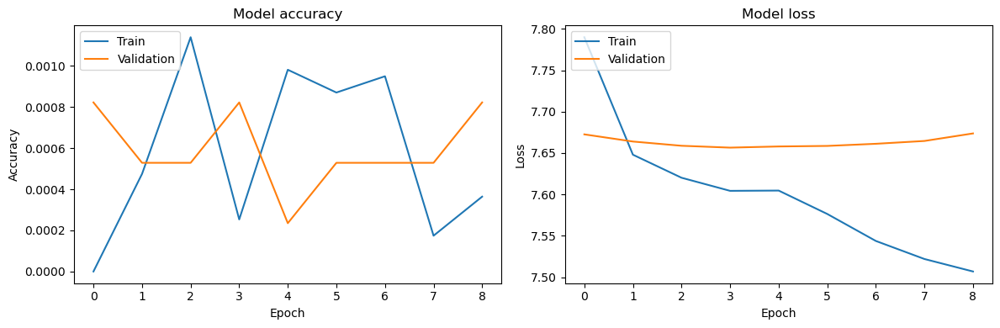

In [31]:
# Plotting training & validation accuracy and loss curve

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [34]:
# Predicting on test data

y_pred_probs = model.predict(test_gen)
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = np.argmax(test_gen.labels, axis=1)


330/330 [==============================] - 98s 295ms/step


In [37]:
# Calculating Precision, recall and F1-score

precision = precision_score(y_true_labels, y_pred_labels, average='weighted') 
recall = recall_score(y_true_labels, y_pred_labels, average='weighted')  
f1 = f1_score(y_true_labels, y_pred_labels, average='weighted') 

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Precision: 5.862288343338841e-07
Recall: 0.0007586533902323376
F1 Score: 1.1715523833334043e-06


D:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [32]:
!pip list


Package                       Version
----------------------------- ---------------
absl-py                       2.0.0
aiobotocore                   2.5.0
aiofiles                      22.1.0
aiohttp                       3.8.5
aioitertools                  0.7.1
aiosignal                     1.2.0
aiosqlite                     0.18.0
alabaster                     0.7.12
anaconda-anon-usage           0.4.2
anaconda-catalogs             0.2.0
anaconda-client               1.12.1
anaconda-cloud-auth           0.1.3
anaconda-navigator            2.5.0
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.1
asttokens                     2.0.5
astunparse                    1.6.3
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs     